In [5]:
import numpy as np
import pygmt as p
import geopandas as gpd
import xarray as xr
import pandas as pd
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw

In [6]:
# converting text(x,y,z) data to csv format 

file_path = "./data/topographic_data_india.csv"

if os.path.exists(file_path):
    print("File exists")
else:
    print("File does not exist")
    df = pd.read_csv("./data/topography_data_india.txt", delim_whitespace=True)
    df.to_csv("./data/topographic_data_india.csv", index=False,header=['longitude','latitude','depth'])
    print("csv convertion successfull!")

File exists


### plotting india's full map using (.txt or .xyz) fild

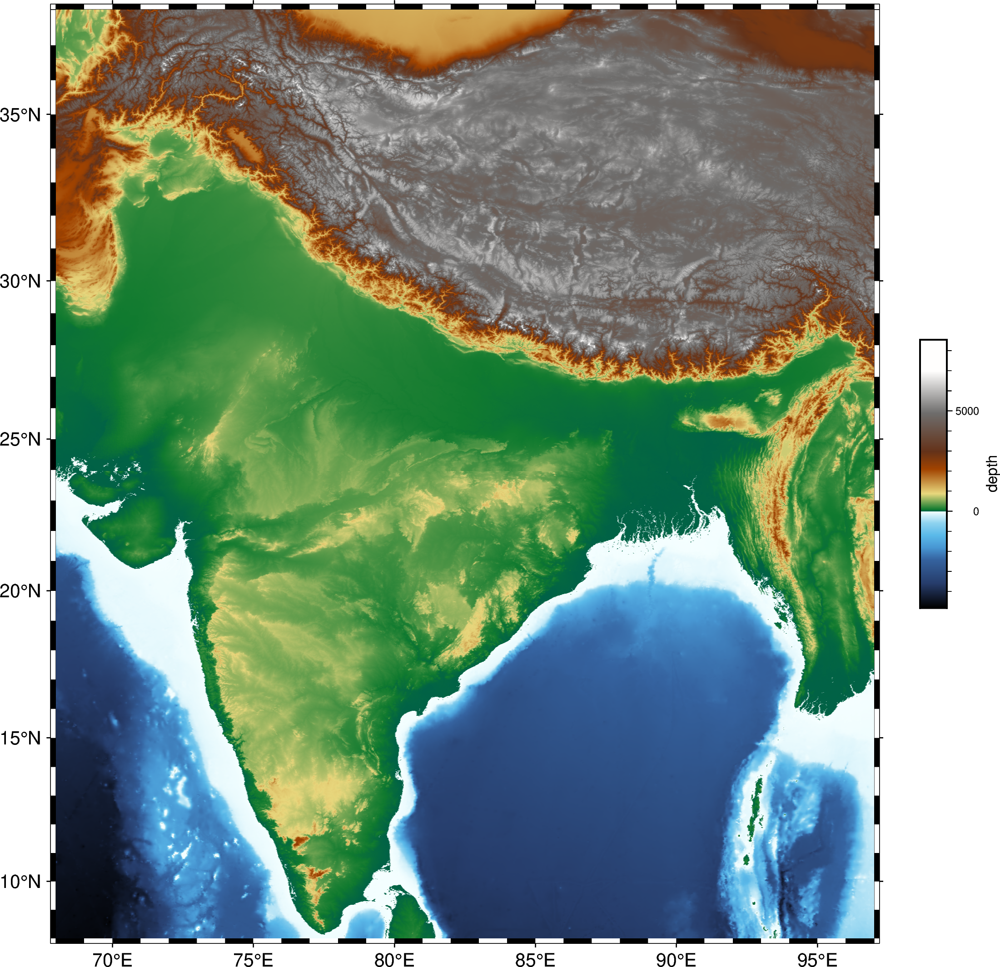

image does not exist
image saved successfull!


In [7]:
# import pygmt
# import pandas as pd

# import os

# reading the csv file and plotting
premision = int(input("if you have change the code and want to rerun the code\n as it take long time to plot , please enter 1: "))
fig = pygmt.Figure()
if (premision == 1):
    data = pd.read_csv("./data/topographic_data_india.csv")
    fig.basemap(region=[68, 97, 8, 38], projection="M6i", frame=True)
    fig.coast(shorelines=True, water="skyblue", land="gray",borders ='1/1p,black')
    pygmt.makecpt(cmap='geo',series=[data['depth'].min(),data['depth'].max()])
    fig.plot(x=data['longitude'],
            y = data['latitude'],
            style='c0.05c',
            fill= data['depth'],
            cmap= True)
    fig.colorbar(frame='af+ldepth', position="JMR+w5c/0.5c") 
    fig.show()
else:
    if os.path.exists("./plots/Full image of india Topography.png"):
        
        # Create a new figure
        # fig = pygmt.Figure()

        # Plot the image
        fig.image(imagefile="./plots/Full image of india Topography.png")

        # Show the plot
        fig.show()
        # plt.imshow(plt.imread("./plots/Full image of india Topography.png"))
    else:
        print(" image doesn't exists please enter 1 to rerun the code")
    
# try one time 
if os.path.exists("./plots/Full image of india Topography.png"):
    print("image exists")
else:
    print("image does not exist")
    fig.savefig('./plots/Full image of india Topography.png')
    print("image saved successfull!")

### how to crop india's land portion from map using geojson file format

C:\Users\THUIN\AppData\Local\Temp\ipykernel_4420\609897348.py:9: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  gdf_clipped = gpd.clip(gdf, boundary)


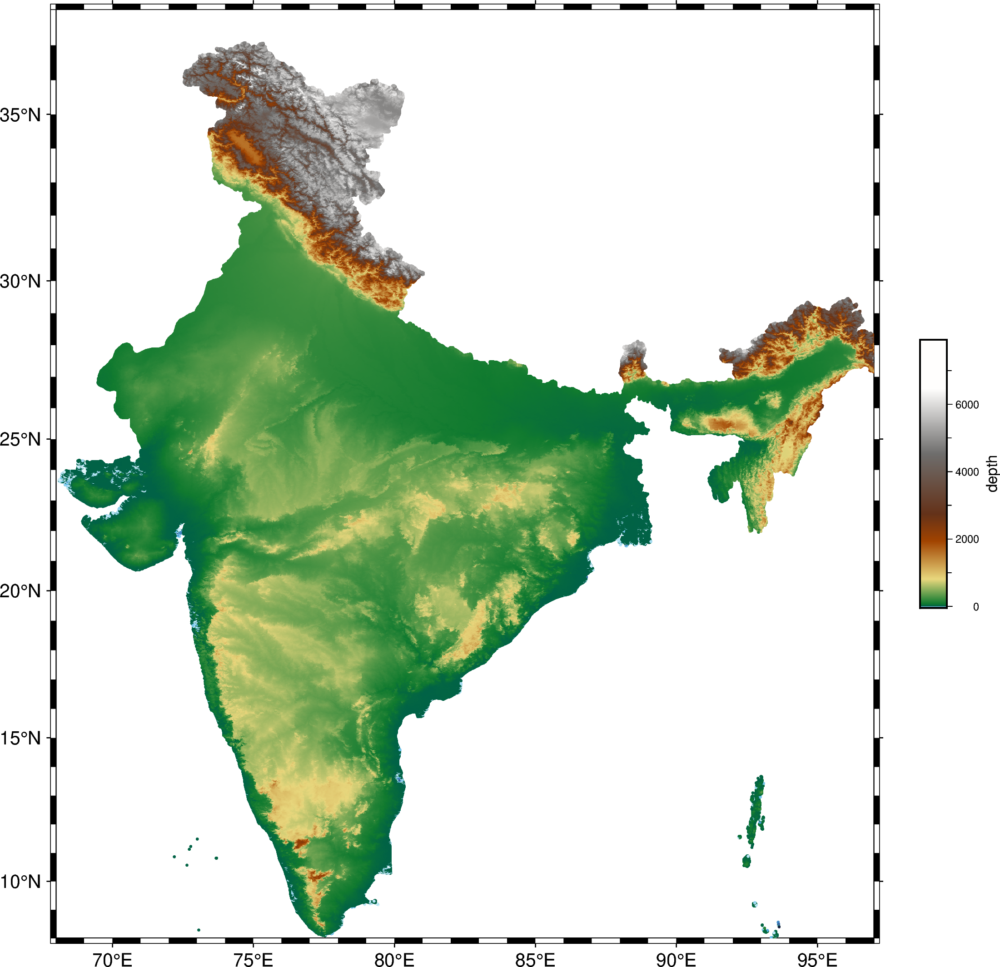

image saved successfull!


In [8]:
# import pygmt
# import pandas as pd
# import geopandas as gpd
# from shapely.geometry import Point

data = pd.read_csv("./data/topographic_data_india.csv")
gdf = gpd.GeoDataFrame(data, geometry=gpd.points_from_xy(data.longitude, data.latitude))
boundary = gpd.read_file("./data/boundary.geojson")
gdf_clipped = gpd.clip(gdf, boundary)
fig = pygmt.Figure()
fig.basemap(region=[68, 97, 8, 38], projection="M6i", frame=True)

# Plot the coastlines and water
# fig.coast(shorelines=True, water="skyblue", land="gray", borders='1/1p,black')

# Create a colormap for the depth values
pygmt.makecpt(cmap="geo", series=[gdf_clipped['depth'].min(), gdf_clipped['depth'].max()])

# Plot the clipped topographic data using longitude, latitude, and depth for color fill
fig.plot(x=gdf_clipped.geometry.x,
         y=gdf_clipped.geometry.y,
         style='c0.05c',
         fill=gdf_clipped['depth'],
         cmap=True)
fig.colorbar(frame='af+ldepth', position="JMR+w5c/0.5c")


fig.show()
# try one time 
if  not os.path.exists("./plots/croped image of india land.png"):
    fig.savefig('./plots/croped image of india land.png')
    print("image saved successfull!")


## indian ocean area topograpic map

In [9]:

world_seas = gpd.read_file("./data/World_Seas_IHO_v3/World_Seas_IHO_v3.shp")
india_shape=world_seas
print('done 1')
img = Image.open("./image manipulation/topographic_plot1.png")
mask = Image.new("L", img.size, 0)

# Define the bounding box of the image in geographic coordinates (e.g., longitude and latitude bounds for India)
bbox = [68, 97, 8, 38]  # Modify this to match your image's geographical extent
print('done 2')
# Function to convert geographic coordinates (lon, lat) to image pixel coordinates
def transform(lon, lat, bbox, img_size):
    x = (lon - bbox[0]) / (bbox[1] - bbox[0]) * img_size[0]
    y = (bbox[3] - lat) / (bbox[3] - bbox[2]) * img_size[1]
    return (x, y)

# Draw the boundary onto the mask
draw = ImageDraw.Draw(mask)

for polygon in india_shape['geometry']:
    if polygon.geom_type == 'Polygon':
        coords = [transform(lon, lat, bbox, img.size) for lon, lat in polygon.exterior.coords]
        draw.polygon(coords, fill=255)
    elif polygon.geom_type == 'MultiPolygon':
        # Loop over each polygon in the MultiPolygon
        for part in polygon.geoms:
            coords = [transform(lon, lat, bbox, img.size) for lon, lat in part.exterior.coords]
            draw.polygon(coords, fill=255)

# Apply the mask to the image, keeping only the area inside the boundary
img_with_mask = Image.composite(img, Image.new("RGB", img.size, (255, 255, 255)), mask)
if not os.path.exists("./image manipulation/croped_ocean.png"):
    img_with_mask.save("./image manipulation/croped_ocean.png")
    img_with_mask.save("./plots/croped_ocean_topo.png")
    
    print("image saved successfull!")
# img_with_mask.save("./plots/India_topographic_map_masked.png")

# Save or show the result
img_with_mask.show()


done 1
done 2
image saved successfull!


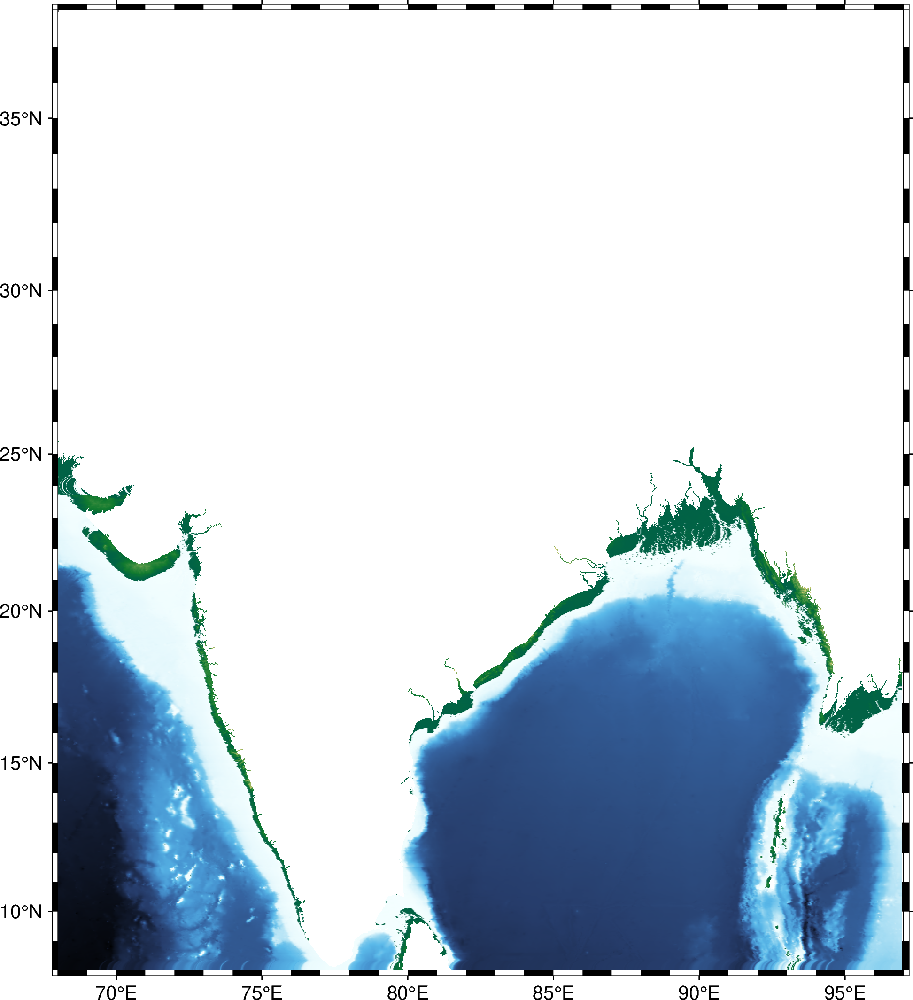

In [2]:
from imageplot import plot_imag

plot_imag("./plots/croped_ocean_topo.png")

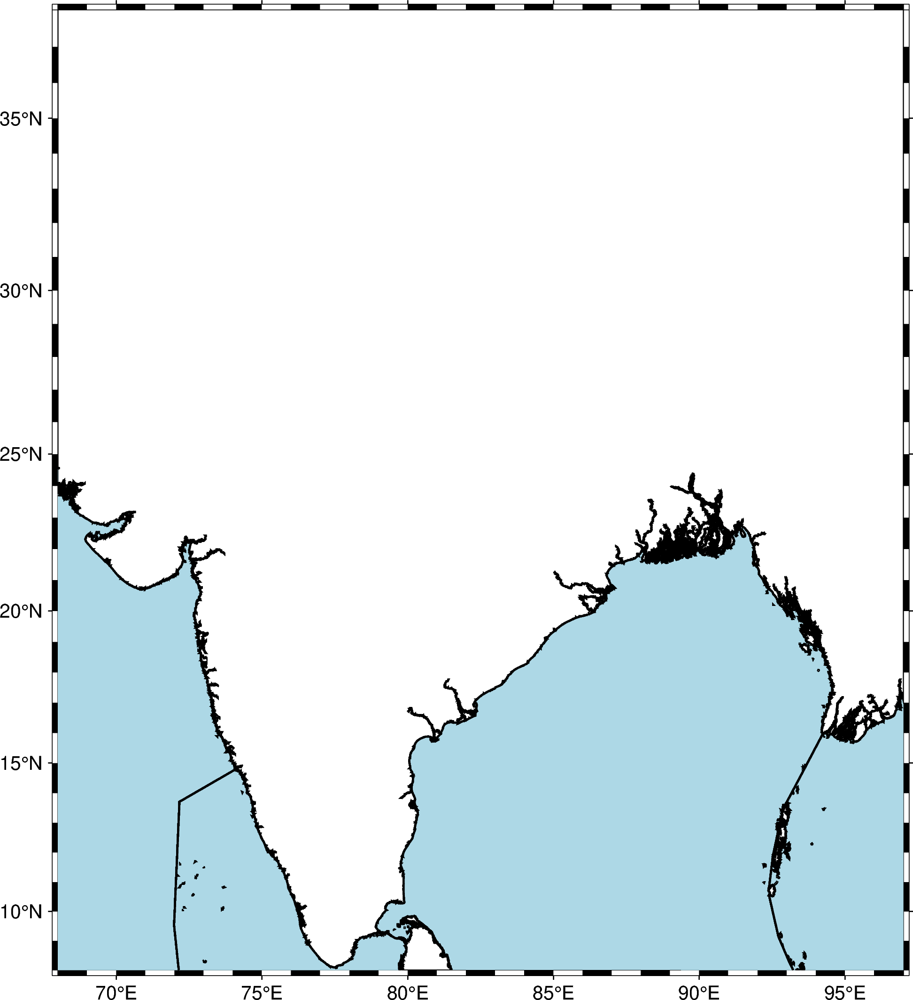

image saved successfull!


In [10]:
import pygmt
import geopandas as gpd

shapefile_path = r"./data/World_Seas_IHO_v3/World_Seas_IHO_v3.shp"
world_seas = gpd.read_file(shapefile_path)
fig = pygmt.Figure()
region = [68, 97, 8, 38]  # Adjust to your area of interest
fig.basemap(region=region, projection="M6i", frame=True)
fig.plot(data=shapefile_path, pen="1p,black", fill="lightblue")
fig.show()
if  not os.path.exists("./plots/croped image of india water.png"):
    fig.savefig('./plots/croped image of india water.png')
    print("image saved successfull!")

## making transpatent image

In [4]:
from PIL import Image
import os

# Open the image
def transparent(img):
    img = Image.open(img)
    img = img.convert("RGBA")
    datas = img.getdata()

    newData = []
    for item in datas:
        if item[0] == 255 and item[1] == 255 and item[2] == 255:
            newData.append((255, 255, 255, 0))
        else:
            newData.append(item)

    img.putdata(newData)
    return img
# Save the image
if not os.path.exists("./image manipulation/transpatent_croped_ocean.png"):
    img1 = transparent("./image manipulation/croped_ocean.png")
    img1.save("./image manipulation/transpatent_croped_ocean.png")
    img1.show()
if not os.path.exists("./image manipulation/transpatent_india.png"):
    img2 = transparent("./image manipulation/india.png")
    img2.save("./image manipulation/transparent_india_land.png")
    img2.show()


## merge land and water portion

In [5]:
from PIL import Image
import os

# Load the first image
image1 = Image.open("./image manipulation/transparent_india_land.png")

# Load the second image
image2 = Image.open("./image manipulation/transpatent_croped_ocean.png")

# Ensure both images have the same mode and size
image2 = image2.resize(image1.size)

# Create a new image with the same size as the input images
merged_image = Image.new("RGB", image1.size)

# Paste the first image onto the merged image
merged_image.paste(image1, (0, 0))

# Paste the second image onto the merged image with transparency
merged_image.paste(image2, (0, 0), image2)

# Save the merged image
if not os.path.exists("./plots/merged_image"):
    merged_image.save("./plots/merged_image.png")

# Show the merged image
# merged_image.show()

## Indian merged map

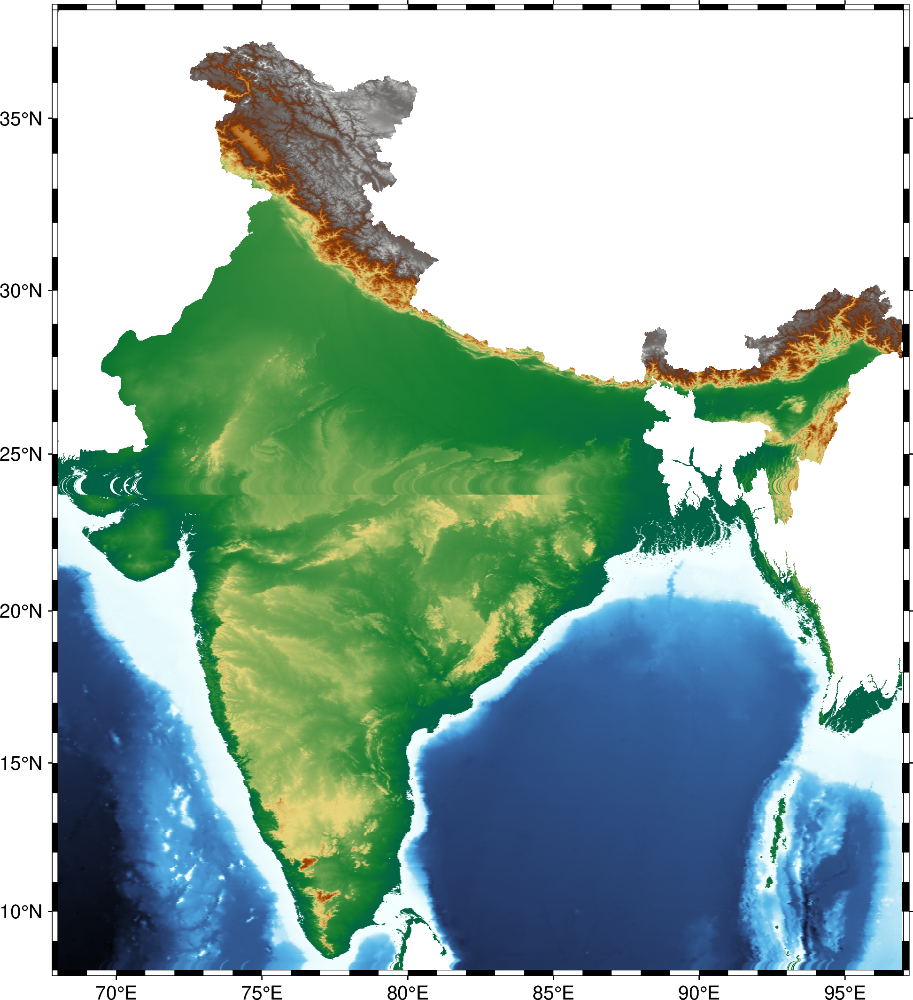

In [6]:
from imageplot import plot_imag

plot_imag("./plots/merged_image.png")
